# CLuster de DIA

In [1]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score
from lightgbm import LGBMRegressor, plot_importance
import random
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import gc
import pickle
from sklearn import metrics



In [2]:
usecols = ['game_id', 'user_id', 'bet_id', 'game_type', 'odds', 'fiat_bet_amount',
       'fiat_profit_amount','fiat_is_valuable']


bets_dtypes = {
    'game_id': 'uint32',
    'user_id': 'uint32',
    'bet_id': 'uint64',
    'game_type': 'category',
    'odds': 'float32',
    'fiat_is_valuable': 'category',
    'fiat_bet_amount': 'float32',
    'fiat_profit_amount': 'float32',
}

bets = pd.read_csv("data/bets.csv", usecols=usecols, dtype=bets_dtypes)
bets = bets[bets['fiat_is_valuable'] == 't']


In [3]:
bets.head()


,game_id,user_id,bet_id,game_type,odds,fiat_is_valuable,fiat_bet_amount,fiat_profit_amount
0,2828375,173570,210854317,normal,0.0,t,0.048738,-0.048738
2,2828375,1139219,210854260,normal,2.0,t,0.000088,0.000088
3,2828375,1329183,12148544,yellow,0.0,t,0.188109,-0.188109
4,2828375,1378328,210854292,normal,0.0,t,0.000005,-0.000005
5,2828375,1420292,210854342,normal,3.0,t,0.000107,0.000213


In [4]:
games_usecols = ['game_id', 'max_rate', 'timestamp'] # ,'bet_count']

games_dtypes = {
    'game_id': 'uint32',
    'max_rate': 'float32',
    'timestamp': 'uint32',
    # 'bet_count': 'uint32',
}

games = pd.read_csv("data/games.csv", usecols=games_usecols, dtype=games_dtypes)


In [5]:

games.head()


,game_id,max_rate,timestamp
0,2828375,6.430000,1599622213
1,2828376,2.100000,1599622213
2,2828377,3.110000,1599622213
3,2828378,24.969999,1599622213
4,2828379,1.040000,1599622213


In [6]:
df = pd.merge(bets, games, on='game_id', how='left')
# liberar memória



In [7]:
del bets, games
gc.collect()


0

In [8]:
df.sort_values(['user_id','game_id'], kind='stable', inplace=True, ignore_index=True)



In [9]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_is_valuable,fiat_bet_amount,fiat_profit_amount,max_rate,timestamp
0,2831698,44,212042687,normal,1.03,t,0.000034,0.000001,2.370000,1599624003
1,2831768,44,212067364,normal,1.03,t,0.000034,0.000001,2.070000,1599624003
2,2831820,44,212085405,normal,1.08,t,0.000034,0.000003,1.150000,1599624003
3,2832628,44,212376980,normal,1.67,t,0.000035,0.000024,2.060000,1599710467
4,2832686,44,212397916,normal,2.00,t,0.000140,0.000140,328.890015,1599710467


In [10]:
df.columns


Index(['game_id', 'user_id', 'bet_id', 'game_type', 'odds', 'fiat_is_valuable',
       'fiat_bet_amount', 'fiat_profit_amount', 'max_rate', 'timestamp'],
      dtype='object')

In [11]:
df = df.drop(columns=['fiat_is_valuable'])


In [12]:
df.head(20)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,timestamp
0,2831698,44,212042687,normal,1.03,0.000034,1.013535e-06,2.370000,1599624003
1,2831768,44,212067364,normal,1.03,0.000034,1.013535e-06,2.070000,1599624003
2,2831820,44,212085405,normal,1.08,0.000034,2.702760e-06,1.150000,1599624003
3,2832628,44,212376980,normal,1.67,0.000035,2.353256e-05,2.060000,1599710467
4,2832686,44,212397916,normal,2.00,0.000140,1.404929e-04,328.890015,1599710467
5,2832689,44,212399028,normal,0.00,0.000140,-1.404929e-04,1.100000,1599710467
6,2832690,44,212399332,normal,2.00,0.000281,2.809858e-04,2.950000,1599710467
7,2832691,44,212399705,normal,2.00,0.000140,1.404929e-04,7.670000,1599710467
8,2837444,44,214069523,normal,1.03,0.000037,1.102917e-06,3.310000,1599796823
9,2843418,44,216156160,normal,1.02,0.000039,7.754470e-07,4.460000,1599969622


In [13]:
conditions = [
    (df['game_type'] == 'normal') & (df['odds'] == 0),
    (df['game_type'] == 'green'),
    (df['game_type'] == 'red'),
    (df['game_type'] == 'yellow')
]

values = [
    df['max_rate'],
    2,
    1.96,
    10
]

df['odds_adjusted'] = np.select(conditions, values, default=df['odds'])


In [14]:
df.head()


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,timestamp,odds_adjusted
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,1599624003,1.03
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,1599624003,1.03
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,1599624003,1.08
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,1599710467,1.67
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,1599710467,2.00


In [15]:
past_bets = df.groupby("user_id")["fiat_bet_amount"].shift(1)

df["user_bet_mean_weighted"] = (
    past_bets
    .groupby(df["user_id"])
    .transform(lambda s: s.ewm(alpha=0.01, adjust=False).mean())
)
df["user_bet_mean_weighted"] = df["user_bet_mean_weighted"].fillna(
    df.groupby("user_id")["fiat_bet_amount"].transform("first")
)

df["user_bet_amount_proportion"] = df["fiat_bet_amount"] / df["user_bet_mean_weighted"]


In [16]:
df.head(10)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,timestamp,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion
0,2831698,44,212042687,normal,1.03,0.000034,1.013535e-06,2.370000,1599624003,1.03,0.000034,1.000000
1,2831768,44,212067364,normal,1.03,0.000034,1.013535e-06,2.070000,1599624003,1.03,0.000034,1.000000
2,2831820,44,212085405,normal,1.08,0.000034,2.702760e-06,1.150000,1599624003,1.08,0.000034,1.000000
3,2832628,44,212376980,normal,1.67,0.000035,2.353256e-05,2.060000,1599710467,1.67,0.000034,1.039625
4,2832686,44,212397916,normal,2.00,0.000140,1.404929e-04,328.890015,1599710467,2.00,0.000034,4.156854
5,2832689,44,212399028,normal,0.00,0.000140,-1.404929e-04,1.100000,1599710467,1.10,0.000035,4.029644
6,2832690,44,212399332,normal,2.00,0.000281,2.809858e-04,2.950000,1599710467,2.00,0.000036,7.822300
7,2832691,44,212399705,normal,2.00,0.000140,1.404929e-04,7.670000,1599710467,2.00,0.000038,3.661361
8,2837444,44,214069523,normal,1.03,0.000037,1.102917e-06,3.310000,1599796823,1.03,0.000039,0.933260
9,2843418,44,216156160,normal,1.02,0.000039,7.754470e-07,4.460000,1599969622,1.02,0.000039,0.984903


In [17]:
# gamma = 0.7
# delta = 0.3
# raw = gamma * np.log(df["odds_adjusted"]) + delta * np.log(df["user_bet_amount_proportion"])
# raw = np.log(df["odds_adjusted"] * df["user_bet_amount_proportion"])

# mu = raw.mean()
# sd = raw.std() + 1e-12
# df["bet_risk"] = (raw - mu) / sd 





In [322]:

df.head(100)


,game_id,user_id,bet_id,game_type,odds,fiat_bet_amount,fiat_profit_amount,max_rate,timestamp,odds_adjusted,user_bet_mean_weighted,user_bet_amount_proportion,bet_risk
0,2831698,44,212042687,normal,1.03,0.000034,0.000001,2.370000,1599624003,1.03,0.000034,1.000000,0.390265
1,2831768,44,212067364,normal,1.03,0.000034,0.000001,2.070000,1599624003,1.03,0.000034,1.000000,0.390265
2,2831820,44,212085405,normal,1.08,0.000034,0.000003,1.150000,1599624003,1.08,0.000034,1.000000,0.405749
3,2832628,44,212376980,normal,1.67,0.000035,0.000024,2.060000,1599710467,1.67,0.000034,1.039625,0.560812
4,2832686,44,212397916,normal,2.00,0.000140,0.000140,328.890015,1599710467,2.00,0.000034,4.156854,1.072405
...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,2828664,5588,12159782,yellow,0.00,7.090167,-7.090167,2.410000,1599624003,10.00,4.320677,1.640985,1.294513
96,2828665,5588,12159820,red,0.00,1.772542,-1.772542,7.400000,1599624003,1.96,4.348371,0.407633,0.307298
97,2828665,5588,12159822,green,2.00,0.886271,0.886271,7.400000,1599624003,2.00,4.322613,0.205031,0.089427
98,2828666,5588,12159859,green,2.00,7.090167,7.090167,3.030000,1599624003,2.00,4.288250,1.653394,0.771265


In [18]:
def downcast_df(df: pd.DataFrame) -> pd.DataFrame:
    float_cols = df.select_dtypes(include=['float64','float32']).columns
    df[float_cols] = df[float_cols].astype('float32', copy=False)

    int_cols = df.select_dtypes(include=['int64','int32','int']).columns
    for c in int_cols:
        if df[c].min() >= 0 and df[c].max() <= np.iinfo(np.uint32).max:
            df[c] = df[c].astype('uint32', copy=False)
        else:
            df[c] = df[c].astype('int32', copy=False)


    if 'user_id' in df.columns:
        df['user_id'] = df['user_id'].astype('category')


    if 'game_id' in df.columns:
        df['game_id'] = df['game_id'].astype('category')

    gc.collect()
    return df


In [19]:
df = downcast_df(df)


In [20]:
# df = df.drop(columns=['game_type','odds','max_rate','odds_adjusted','user_bet_amount_proportion','user_bet_mean_weighted'])
df = df.drop(columns=['game_type','odds','max_rate','user_bet_mean_weighted'])
df.head()


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,odds_adjusted,user_bet_amount_proportion
0,2831698,44,212042687,0.000034,0.000001,1599624003,1.03,1.000000
1,2831768,44,212067364,0.000034,0.000001,1599624003,1.03,1.000000
2,2831820,44,212085405,0.000034,0.000003,1599624003,1.08,1.000000
3,2832628,44,212376980,0.000035,0.000024,1599710467,1.67,1.039625
4,2832686,44,212397916,0.000140,0.000140,1599710467,2.00,4.156854


In [23]:
# g = (df.groupby('game_id', observed=True)
#        .agg(
#         #   risk_mean_game   = ('risk', 'mean'),
#         #   risk_std_game    = ('risk', 'std'),
#           game_risk_median = ('bet_risk', 'median'),
#           game_risk_mad    = ('bet_risk', lambda s: (s - s.median()).abs().median()),
#        #    n_bets_game      = ('risk', 'size'),
#        )
#        .astype('float32'))

# df = df.join(g, on='game_id')


In [24]:
df.head()


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,odds_adjusted,user_bet_amount_proportion
0,2831698,44,212042687,0.000034,0.000001,1599624003,1.03,1.000000
1,2831768,44,212067364,0.000034,0.000001,1599624003,1.03,1.000000
2,2831820,44,212085405,0.000034,0.000003,1599624003,1.08,1.000000
3,2832628,44,212376980,0.000035,0.000024,1599710467,1.67,1.039625
4,2832686,44,212397916,0.000140,0.000140,1599710467,2.00,4.156854


In [25]:
# df.drop(columns=['risk_mean_game','risk_std_game','risk_rel_game_z','risk_rel_game_mad','risk_median_game', 'risk_mad_game'], inplace=True)



In [ ]:
# df["risk_rel_game_z"] = (df["risk"] - df["risk_mean_game"]) / (df["risk_std_game"] + 1e-12)
# df["bet_risk_mad"] = (df["bet_risk"] - df["game_risk_median"]) / 1.4826 * df["game_risk_mad"] + 1e-12


In [26]:
df.head(100)


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,odds_adjusted,user_bet_amount_proportion
0,2831698,44,212042687,0.000034,0.000001,1599624003,1.03,1.000000
1,2831768,44,212067364,0.000034,0.000001,1599624003,1.03,1.000000
2,2831820,44,212085405,0.000034,0.000003,1599624003,1.08,1.000000
3,2832628,44,212376980,0.000035,0.000024,1599710467,1.67,1.039625
4,2832686,44,212397916,0.000140,0.000140,1599710467,2.00,4.156854
...,...,...,...,...,...,...,...,...
95,2828664,5588,12159782,7.090167,-7.090167,1599624003,10.00,1.640985
96,2828665,5588,12159820,1.772542,-1.772542,1599624003,1.96,0.407633
97,2828665,5588,12159822,0.886271,0.886271,1599624003,2.00,0.205031
98,2828666,5588,12159859,7.090167,7.090167,1599624003,2.00,1.653394


In [27]:
df.columns


Index(['game_id', 'user_id', 'bet_id', 'fiat_bet_amount', 'fiat_profit_amount',
       'timestamp', 'odds_adjusted', 'user_bet_amount_proportion'],
      dtype='object')

In [28]:
# df.drop(columns=['game_risk_median', 'game_risk_mad'], inplace=True)



In [29]:
df.head(10)


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,odds_adjusted,user_bet_amount_proportion
0,2831698,44,212042687,0.000034,1.013535e-06,1599624003,1.03,1.000000
1,2831768,44,212067364,0.000034,1.013535e-06,1599624003,1.03,1.000000
2,2831820,44,212085405,0.000034,2.702760e-06,1599624003,1.08,1.000000
3,2832628,44,212376980,0.000035,2.353256e-05,1599710467,1.67,1.039625
4,2832686,44,212397916,0.000140,1.404929e-04,1599710467,2.00,4.156854
5,2832689,44,212399028,0.000140,-1.404929e-04,1599710467,1.10,4.029644
6,2832690,44,212399332,0.000281,2.809858e-04,1599710467,2.00,7.822300
7,2832691,44,212399705,0.000140,1.404929e-04,1599710467,2.00,3.661361
8,2837444,44,214069523,0.000037,1.102917e-06,1599796823,1.03,0.933260
9,2843418,44,216156160,0.000039,7.754470e-07,1599969622,1.02,0.984903


In [30]:
df['datetime'] = pd.to_datetime(df['timestamp'], unit='s')
df = df.sort_values(['user_id', 'datetime'])
df = df.set_index('datetime')


In [31]:
df.head()


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,odds_adjusted,user_bet_amount_proportion
datetime,,,,,,,,
2020-09-09 04:00:03,2831698,44,212042687,0.000034,0.000001,1599624003,1.03,1.000000
2020-09-09 04:00:03,2831768,44,212067364,0.000034,0.000001,1599624003,1.03,1.000000
2020-09-09 04:00:03,2831820,44,212085405,0.000034,0.000003,1599624003,1.08,1.000000
2020-09-10 04:01:07,2832628,44,212376980,0.000035,0.000024,1599710467,1.67,1.039625
2020-09-10 04:01:07,2832686,44,212397916,0.000140,0.000140,1599710467,2.00,4.156854


In [32]:
# df["bet_risk"] = 1 / (1 + np.exp(-df["bet_risk"]))
# df["bet_risk_mad"] = 1 / (1 + np.exp(-df["bet_risk_mad"]))


In [33]:
# df.head()


In [34]:
df = downcast_df(df)


In [35]:
df.columns


Index(['game_id', 'user_id', 'bet_id', 'fiat_bet_amount', 'fiat_profit_amount',
       'timestamp', 'odds_adjusted', 'user_bet_amount_proportion'],
      dtype='object')

In [37]:
df['date'] = df.index.normalize()

daily = (df
    .groupby(['user_id','date'], observed=True)
    .agg(
        odds_mean   = ('odds_adjusted', 'mean'),
        odds_median = ('odds_adjusted', 'median'),
        odds_std    = ('odds_adjusted', 'std'),
        odds_max    = ('odds_adjusted', 'max'),
        odds_p95    = ('odds_adjusted', lambda s: s.quantile(0.95)),
        
        n_bets = ('bet_id', 'size'),
        
        bet_sum     = ('fiat_bet_amount', 'sum'),
        bet_mean    = ('fiat_bet_amount', 'mean'),
        bet_max     = ('fiat_bet_amount', 'max'),
        bet_std     = ('fiat_bet_amount', 'std'),
        profit_sum  = ('fiat_profit_amount', 'sum'),
        
        bet_prop_mean   = ('user_bet_amount_proportion', 'mean'),
        bet_prop_median = ('user_bet_amount_proportion', 'median'),
        bet_prop_std    = ('user_bet_amount_proportion', 'std'),
        bet_prop_max    = ('user_bet_amount_proportion', 'max')
    )
    .reset_index()
)


In [38]:
daily['odds_std'] = daily['odds_std'].fillna(0.0).astype('float32')
daily['bet_std'] = daily['bet_std'].fillna(0.0).astype('float32')
daily['bet_prop_std'] = daily['bet_prop_std'].fillna(0.0).astype('float32')


In [39]:
daily = daily.sort_values(['user_id','date'])


In [40]:
daily.head(10)


,user_id,date,odds_mean,odds_median,odds_std,odds_max,odds_p95,n_bets,bet_sum,bet_mean,bet_max,bet_std,profit_sum,bet_prop_mean,bet_prop_median,bet_prop_std,bet_prop_max
0,44,2020-09-09,1.046667,1.030,0.028868,1.08,1.0750,3,0.000101,0.000034,0.000034,0.000000,0.000005,1.000000,1.000000,0.000000,1.000000
1,44,2020-09-10,1.754000,2.000,0.392530,2.00,2.0000,5,0.000738,0.000148,0.000281,0.000087,0.000445,4.141957,4.029644,2.419359,7.822300
2,44,2020-09-11,1.030000,1.030,0.000000,1.03,1.0300,1,0.000037,0.000037,0.000037,0.000000,0.000001,0.933260,0.933260,0.000000,0.933260
3,44,2020-09-13,1.037500,1.025,0.028723,1.08,1.0725,4,0.000271,0.000068,0.000155,0.000058,0.000008,1.716950,0.984977,1.482621,3.940794
4,44,2020-09-15,1.106000,1.060,0.124774,1.40,1.3930,15,0.000565,0.000038,0.000038,0.000000,0.000021,0.933912,0.933962,0.002774,0.938171
5,44,2020-09-17,1.066667,1.050,0.028868,1.10,1.0950,3,0.010954,0.003651,0.003651,0.000000,0.000730,57.197235,47.912788,30.312243,91.065842
6,44,2020-09-18,1.404000,1.225,0.411534,2.12,2.0840,10,0.055326,0.005533,0.038880,0.011862,0.004075,29.185577,4.414735,80.845459,259.127625
7,44,2020-09-19,1.244000,1.040,0.396434,2.10,1.9920,10,3.453575,0.345358,1.532691,0.492634,0.555268,87.831734,9.082420,173.456848,550.338257
8,44,2020-09-21,1.038000,1.040,0.008367,1.05,1.0480,5,0.011537,0.002307,0.003710,0.001924,0.000428,0.071746,0.114402,0.059926,0.116454
9,44,2020-09-24,1.308333,1.075,0.445928,2.23,2.2025,12,0.029411,0.002451,0.006422,0.003064,0.005381,0.083972,0.006157,0.105205,0.223137


In [41]:
past_bets = daily.groupby("user_id")["n_bets"].shift(1)

daily["user_daily_bet"] = (
    past_bets
    .groupby(daily["user_id"])
    .transform(lambda s: s.ewm(alpha=0.1, adjust=False).mean())
)
daily["user_daily_bet"] = daily["user_daily_bet"].fillna(
    daily.groupby("user_id")["n_bets"].transform("first")
)

daily["n_bet_proportion"] = daily["n_bets"] / daily["user_daily_bet"]


C:\Users\mathe\AppData\Local\Temp\ipykernel_24256\795915297.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  past_bets = daily.groupby("user_id")["n_bets"].shift(1)
C:\Users\mathe\AppData\Local\Temp\ipykernel_24256\795915297.py:5: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  .groupby(daily["user_id"])
C:\Users\mathe\AppData\Local\Temp\ipykernel_24256\795915297.py:9: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  daily

In [43]:
daily.drop(columns=['user_daily_bet'], inplace=True)


In [44]:
daily.head()


,user_id,date,odds_mean,odds_median,odds_std,odds_max,odds_p95,n_bets,bet_sum,bet_mean,bet_max,bet_std,profit_sum,bet_prop_mean,bet_prop_median,bet_prop_std,bet_prop_max,n_bet_proportion
0,44,2020-09-09,1.046667,1.030,0.028868,1.08,1.0750,3,0.000101,0.000034,0.000034,0.000000,0.000005,1.000000,1.000000,0.000000,1.000000,1.000000
1,44,2020-09-10,1.754000,2.000,0.392530,2.00,2.0000,5,0.000738,0.000148,0.000281,0.000087,0.000445,4.141957,4.029644,2.419359,7.822300,1.666667
2,44,2020-09-11,1.030000,1.030,0.000000,1.03,1.0300,1,0.000037,0.000037,0.000037,0.000000,0.000001,0.933260,0.933260,0.000000,0.933260,0.312500
3,44,2020-09-13,1.037500,1.025,0.028723,1.08,1.0725,4,0.000271,0.000068,0.000155,0.000058,0.000008,1.716950,0.984977,1.482621,3.940794,1.342282
4,44,2020-09-15,1.106000,1.060,0.124774,1.40,1.3930,15,0.000565,0.000038,0.000038,0.000000,0.000021,0.933912,0.933962,0.002774,0.938171,4.866970


In [45]:
daily.columns


Index(['user_id', 'date', 'odds_mean', 'odds_median', 'odds_std', 'odds_max',
       'odds_p95', 'n_bets', 'bet_sum', 'bet_mean', 'bet_max', 'bet_std',
       'profit_sum', 'bet_prop_mean', 'bet_prop_median', 'bet_prop_std',
       'bet_prop_max', 'n_bet_proportion'],
      dtype='object')

In [46]:
features = [
        'odds_mean', 'odds_median', 'odds_std', 'odds_max',
        'odds_p95', 'n_bets', 'bet_sum', 'bet_mean', 'bet_max', 'bet_std',
        'profit_sum', 'bet_prop_mean', 'bet_prop_median', 'bet_prop_std',
        'bet_prop_max', 'n_bet_proportion'
       ]

# features = [
#         # 'risk_mean', 'risk_median', 'risk_std', 'risk_max','risk_p95', 
#         'risk_mad_mean', 'risk_mad_median', 'risk_mad_std','risk_mad_max', 
        
#         # 'n_bets', 'bet_sum', 'bet_mean', 'bet_max', 'bet_std',
#         # 'profit_sum', 
        
#         # 'bet_prop_mean', 'bet_prop_median', 'bet_prop_std',
#         # 'bet_prop_max', 
#         # 'odds_mean', 'odds_max', 'odds_std',
        
#         'n_bet_proportion'
# ]


In [47]:
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

import hdbscan
from hdbscan import prediction


In [48]:
X = daily[features]


In [49]:
X.iloc[0]


odds_mean           1.046667
odds_median         1.030000
odds_std            0.028868
odds_max            1.080000
odds_p95            1.075000
n_bets              3.000000
bet_sum             0.000101
bet_mean            0.000034
bet_max             0.000034
bet_std             0.000000
profit_sum          0.000005
bet_prop_mean       1.000000
bet_prop_median     1.000000
bet_prop_std        0.000000
bet_prop_max        1.000000
n_bet_proportion    1.000000
Name: 0, dtype: float64

In [60]:
def scale_and_pca(X: pd.DataFrame, n_components: int = 3) -> pd.DataFrame:
    scaler = RobustScaler()
    X_scaled = scaler.fit_transform(X)
    pca = PCA(n_components=n_components, random_state=42)
    Xr = pca.fit_transform(X_scaled)
    return pd.DataFrame(Xr)


In [75]:
Xr = scale_and_pca(X, 3)


In [76]:
len(Xr)


130173

In [77]:
Xr.head()


,0,1,2
0,-1.937079e+07,-6.081893e+06,-219536.999341
1,-1.937079e+07,-6.081894e+06,-219536.844845
2,-1.937079e+07,-6.081893e+06,-219536.910812
3,-1.937079e+07,-6.081893e+06,-219536.735306
4,-1.937079e+07,-6.081893e+06,-219536.906403


In [78]:

import plotly.express as px


In [79]:
def remove_outliers(df: pd.DataFrame) -> pd.DataFrame:
    df = df.copy()
    for col in df.columns:
        q1 = df[col].quantile(0.005)
        q3 = df[col].quantile(0.995)
        iqr = q3 - q1
        lower = q1 - 1.5 * iqr
        upper = q3 + 1.5 * iqr
        df = df[(df[col] >= lower) & (df[col] <= upper)]
    return df


In [80]:
filtered_df = remove_outliers(Xr)


In [83]:
def plot_pca(X: pd.DataFrame) -> None:
    columns = X.columns
    fig = px.scatter_3d(
        X, x=columns[0], y=columns[1], z=columns[2],
        opacity=0.10
    )
    fig.update_traces(marker=dict(size=1, color='blue'))
    fig.update_layout(title='PCA 3D', template='plotly_white')
    fig.show()


In [84]:
plot_pca(filtered_df)


In [85]:
def train(Xr: pd.DataFrame, min_cluster_size: int = 500, min_samples: int = 12, method: str = "eom", plot=False) -> pd.Series:
    hdb = hdbscan.HDBSCAN(
        min_cluster_size=min_cluster_size,        
        min_samples=min_samples,             
        metric="euclidean",
        cluster_selection_method=method,
        # cluster_selection_epsilon=0.1,
        core_dist_n_jobs=-1,
        prediction_data=True
    )
    labels = hdb.fit_predict(Xr)
    mask = labels != -1
    sil = silhouette_score(X[mask], labels[mask]) if mask.any() else None
    print({"n_clusters": len(set(labels)) - (1 if -1 in labels else 0),
        "pct_ruido": float(np.mean(~mask)),
        "silhouette": sil})
    if plot:
        ax = hdb.condensed_tree_.plot(select_clusters=True)
        plt.show()


    return labels, hdb


In [608]:
from itertools import product

size = [100, 250, 500, 1000, 2000, 5000]
samples = [3, 6, 12, 24, 32, 48, 72]
method = ['eom', 'leaf']

combinations = list(product(size, samples, method))
for combination in combinations:
    print(combination)
    labels, hdb = train(Xr, *combination, plot=False)



(100, 3, 'eom')
{'n_clusters': 88, 'pct_ruido': 0.7998125571355043, 'silhouette': 0.0314729305731059}
(100, 3, 'leaf')
{'n_clusters': 120, 'pct_ruido': 0.8424942192313306, 'silhouette': 0.26082050203708257}
(100, 6, 'eom')
{'n_clusters': 44, 'pct_ruido': 0.8364484186428829, 'silhouette': -0.03241331144561569}
(100, 6, 'leaf')
{'n_clusters': 79, 'pct_ruido': 0.898734760664654, 'silhouette': 0.3602526412939815}
(100, 12, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.023307444708196016, 'silhouette': 0.9353459389302758}
(100, 12, 'leaf')
{'n_clusters': 56, 'pct_ruido': 0.9219961128651871, 'silhouette': 0.39871570813223084}
(100, 24, 'eom')
{'n_clusters': 14, 'pct_ruido': 0.871025481474653, 'silhouette': 0.07749666822429109}
(100, 24, 'leaf')
{'n_clusters': 37, 'pct_ruido': 0.9449194533428591, 'silhouette': 0.4648817511674978}
(100, 32, 'eom')
{'n_clusters': 8, 'pct_ruido': 0.7680471372711699, 'silhouette': 0.3392669592477116}
(100, 32, 'leaf')
{'n_clusters': 33, 'pct_ruido': 0.9483379809945227,

In [ ]:
size = [10000, 20000]
samples = [32, 48, 72, 144]
method = ['eom']

combinations = list(product(size, samples, method))
for combination in combinations:
    print(combination)
    labels, hdb = train(Xr, *combination, plot=False)


(10000, 32, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.6450339164035552, 'silhouette': 0.6698097696859951}
(10000, 48, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.4315103746552664, 'silhouette': 0.5325071361826275}
(10000, 72, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.6516328270839575, 'silhouette': 0.6784503050950332}
(10000, 144, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.3627710815606923, 'silhouette': 0.5034698872077675}
(10000, 288, 'eom')
{'n_clusters': 2, 'pct_ruido': 0.3582616978943406, 'silhouette': 0.5043345547717331}
(10000, 576, 'eom')


OSError: [WinError 1450] Insufficient system resources exist to complete the requested service

{'n_clusters': 2, 'pct_ruido': 0.6936077373956197, 'silhouette': 0.1484118257041081}


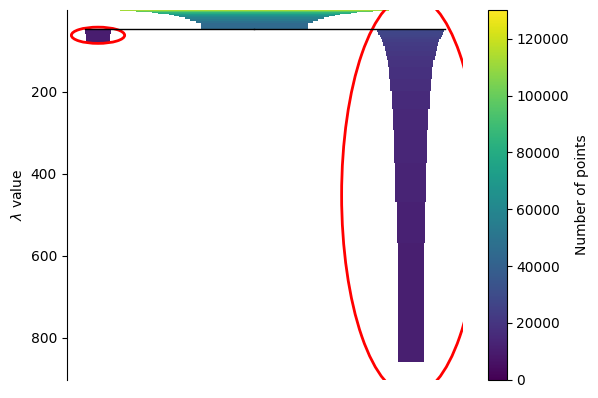

In [86]:
labels, hdb = train(Xr,10000, 144, 'eom', plot=True)
# labels, hdb = train(Xr,100, 12, 'eom', plot=True)



In [87]:
pd.Series(labels).value_counts().sort_index()


-1    90289
 0    11086
 1    28798
Name: count, dtype: int64

In [90]:
def plot_clusters(X: pd.DataFrame, labels: pd.Series) -> None:
    labels_s = pd.Series(labels, name='cluster')
    plot_df = X.join(labels_s, how='left')

    plot_df['cluster_name'] = np.where(plot_df['cluster'] == -1, 'Ruído',
                                        'C' + plot_df['cluster'].astype(str))
    
    color_map = {'Ruído': '#9e9e9e',
                 'C1': '#1f77b4',
                 'C2': '#ff7f0e',
                 'C3': '#2ca02c',
                 'C4': '#d62728',
                 'C5': '#9467bd',
                 'C6': '#8c564b',
                 'C7': '#e377c2'}
    columns = X.columns
    fig = px.scatter_3d(
        plot_df, x=columns[0], y=columns[1], z=columns[2],
        color='cluster_name', opacity=0.10,
        color_discrete_map=color_map
    )
    fig.update_traces(marker=dict(size=1))
    fig.update_layout(title='PCA 3D por cluster', template='plotly_white')
    fig.show()


In [91]:

plot_clusters(filtered_df,labels)


In [92]:
def threshold_clusters(labels: pd.Series, hdb: hdbscan.HDBSCAN, threshold: float = 0.3) -> pd.Series:
    soft = prediction.all_points_membership_vectors(hdb)
    
    max_prob = soft.max(axis=1)
    argmax = soft.argmax(axis=1)
    
    labels_thresholded = labels.copy()
    mask_ruido = labels == -1
    labels_thresholded[mask_ruido & (max_prob >= threshold)] = argmax[mask_ruido & (max_prob >= threshold)]

    return labels_thresholded


In [93]:
labels_thresholded = threshold_clusters(labels, hdb, 0.3)
plot_clusters(filtered_df,labels_thresholded)


In [653]:
labels_thresholded = threshold_clusters(labels, hdb, 0.5)
plot_clusters(filtered_df,labels_thresholded)


In [654]:
pd.Series(labels_thresholded).value_counts().sort_index()


-1      1615
 0       585
 1    127973
Name: count, dtype: int64

In [655]:
daily.head()


,user_id,date,risk_mean,risk_median,risk_std,risk_max,risk_p95,risk_mad_mean,risk_mad_median,risk_mad_std,...,bet_std,profit_sum,bet_prop_mean,bet_prop_median,bet_prop_std,bet_prop_max,odds_mean,odds_max,odds_std,n_bet_proportion
0,44,2020-09-09,0.395426,0.390265,0.008939,0.405749,0.404200,-0.011850,-0.016374,0.065323,...,0.000000,0.000005,1.000000,1.000000,0.000000,1.000000,1.046667,1.08,0.028868,1.000000
1,44,2020-09-10,0.962010,1.030946,0.268029,1.278913,1.237612,0.134200,0.148884,0.055431,...,0.000087,0.000445,4.141957,4.029644,2.419359,7.822300,1.754000,2.00,0.392530,1.666667
2,44,2020-09-11,0.367703,0.367703,0.000000,0.367703,0.367703,0.002798,0.002798,0.000000,...,0.000000,0.000001,0.933260,0.933260,0.000000,0.933260,1.030000,1.03,0.000000,0.312500
3,44,2020-09-13,0.498473,0.391469,0.224619,0.835028,0.769898,0.020656,0.021905,0.036380,...,0.000058,0.000008,1.716950,0.984977,1.482621,3.940794,1.037500,1.08,0.028723,1.342282
4,44,2020-09-15,0.389442,0.375759,0.033961,0.467090,0.466823,0.074034,0.070790,0.061930,...,0.000000,0.000021,0.933912,0.933962,0.002774,0.938171,1.106000,1.40,0.124774,4.866970


In [656]:

cluster_labels = pd.Series(labels, name="cluster_label")
cluster_labels[0]


1

In [657]:

labeled = daily.copy()
labeled['cluster_label'] = cluster_labels


In [659]:
labeled[labeled['cluster_label'] == 0].head()


,user_id,date,risk_mean,risk_median,risk_std,risk_max,risk_p95,risk_mad_mean,risk_mad_median,risk_mad_std,...,profit_sum,bet_prop_mean,bet_prop_median,bet_prop_std,bet_prop_max,odds_mean,odds_max,odds_std,n_bet_proportion,cluster_label
303,46803,2020-09-14,0.276035,0.277319,0.665960,1.566056,1.267206,0.026839,0.012427,0.135599,...,-0.051720,1.432866,0.267964,2.578017,19.645369,2.706667,10.000000,2.123386,30.026575,0
689,58444,2020-09-18,0.253300,0.325015,0.421685,0.879024,0.732430,0.036617,0.056568,0.145961,...,0.084849,0.388535,0.305544,0.330842,1.746884,4.001990,42.070000,4.329585,35.189773,0
1319,78649,2020-09-16,0.637245,0.735363,0.697999,1.756121,1.405321,0.057241,0.077682,0.147844,...,0.098136,4.023283,2.830395,6.894970,65.465286,2.088110,10.000000,2.634179,32.347140,0
1836,97864,2020-09-13,0.654078,0.713907,0.607648,2.028861,1.530368,0.057610,0.054781,0.094455,...,-17.742737,3.131496,1.104189,9.192460,117.734680,3.259675,52.720001,4.118485,34.119863,0
3691,168078,2020-09-13,0.793099,0.951816,0.863136,3.116354,1.793124,0.073034,0.114423,0.147334,...,-23.420914,81.233795,4.714029,394.596252,2169.470947,1.677000,2.500000,0.409324,30.000000,0


In [660]:

clusters = (labeled
    .groupby(['cluster_label'], observed=True)
    .agg(
        days = ('risk_mean', 'size'),
        risk_mean_mean   = ('risk_mean', 'mean'),
        risk_median_mean = ('risk_median', 'mean'),
        risk_std_mean    = ('risk_std', 'mean'),
        risk_max_mean = ('risk_max', 'mean'),
        risk_p95_mean = ('risk_p95', 'mean'),
        
        risk_mad_mean_mean   = ('risk_mad_mean', 'mean'),
        risk_mad_median_mean = ('risk_mad_median', 'mean'),
        risk_mad_std_mean    = ('risk_mad_std', 'mean'),
        
        n_bets_mean      = ('n_bets', 'mean'),
        # n_games     = ('game_id', 'nunique'),
        bet_sum_mean     = ('bet_sum', 'mean'),
        bet_mean_mean    = ('bet_mean', 'mean'),
        bet_max_mean    = ('bet_max', 'mean'),
        profit_sum_mean  = ('profit_sum', 'mean'),
        
        odds_mean_mean   = ('odds_mean', 'mean'),
        odds_max_mean    = ('odds_max', 'mean'),
        # day_prop_mean   = ('bet_proportion_weighted', 'mean'),
    )
    .reset_index()
)




In [661]:
clusters


,cluster_label,days,risk_mean_mean,risk_median_mean,risk_std_mean,risk_max_mean,risk_p95_mean,risk_mad_mean_mean,risk_mad_median_mean,risk_mad_std_mean,n_bets_mean,bet_sum_mean,bet_mean_mean,bet_max_mean,profit_sum_mean,odds_mean_mean,odds_max_mean
0,-1,3034,-1.691622,-1.786356,1.416942,1.073868,0.092974,-0.394908,-0.383680,0.379720,231.893210,49.927204,0.423180,3.310366,-0.545605,2.152794,21.964956
1,0,110,0.499845,0.506515,0.478789,1.589064,1.143045,0.051958,0.055048,0.097934,362.427273,118.474976,0.529948,3.023370,3.818760,2.332772,18.586454
2,1,127029,-0.052947,-0.034531,0.571797,0.962309,0.637596,-0.039935,-0.032122,0.122257,177.853034,87.250648,0.615848,3.674217,-1.315475,2.183461,8.756295


In [638]:
X2 = labeled[labeled['cluster_label'] == -1]
X2 = X2[features]
X2


,risk_mad_mean,risk_mad_median,risk_mad_std,risk_mad_max,n_bet_proportion
1,0.134200,0.148884,0.055431,0.189527,1.666667
4,0.074034,0.070790,0.061930,0.157794,4.866970
5,0.328698,0.385724,0.122245,0.412010,0.701951
6,0.186208,0.169041,0.201317,0.596304,2.411719
7,0.074636,0.150947,0.260998,0.413387,2.113370
...,...,...,...,...,...
130119,-0.239416,-0.313449,0.231880,0.332863,1.000000
130134,0.418043,0.418043,0.578336,0.826988,1.000000
130145,-0.511168,-0.584291,0.244812,0.214867,1.000000
130155,0.385944,0.240506,0.391353,0.956675,1.000000


In [639]:
Xr2 = scale_and_pca(X2, 3)
Xr2_out = remove_outliers(Xr2)
plot_pca(Xr2_out)


In [643]:
labels, hdb2 = train(Xr2, 2500, 36, 'eom', plot=True)
plot_clusters(Xr2, labels)


ValueError: Item wrong length 47223 instead of 130173.

In [ ]:
labels_thresholded = threshold_clusters(labels, hdb2)
plot_clusters(Xr2, labels_thresholded)


In [240]:
Xr2 = PCA(n_components=0.95, random_state=42).fit_transform(
    StandardScaler().fit_transform(X2)
)
Xr2[0]


array([ 1.37110194, -0.55259303,  0.61080993,  0.46076637])

In [250]:
hdb2 = hdbscan.HDBSCAN(
    min_cluster_size=200,        
    min_samples=8,             
    metric="euclidean",
    cluster_selection_method="leaf",
    core_dist_n_jobs=-1,  
    prediction_data=False     
)


In [251]:
labels = hdb2.fit_predict(Xr2)

mask = labels != -1
sil = silhouette_score(X2[mask], labels[mask]) if mask.any() else None
print({"n_clusters": len(set(labels)) - (1 if -1 in labels else 0),
       "pct_ruido": float(np.mean(~mask)),
       "silhouette": sil})




{'n_clusters': 8, 'pct_ruido': 0.916609867716404, 'silhouette': 0.2603738173386951}


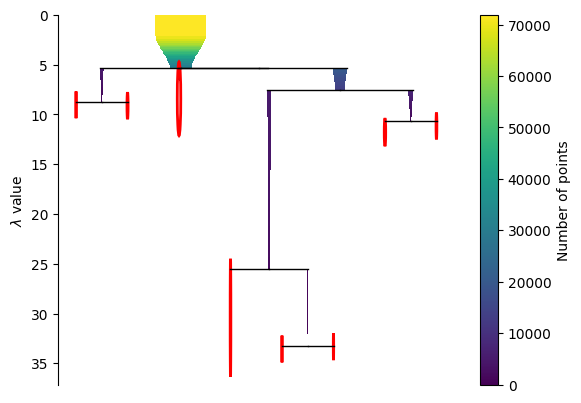

In [252]:
pd.Series(labels).value_counts().sort_index()
ax = hdb2.condensed_tree_.plot(select_clusters=True)
plt.show()


In [ ]:
# results = []

# for k in range(2, 5):
#     km = KMeans(
#         n_clusters=k,
#         random_state=42,
#         n_init="auto",
#     )
#     labels = km.fit_predict(X_scaled)
#     inertia = km.inertia_
    
#     sil = silhouette_score(X_scaled, labels)
#     results.append((k, inertia, sil))

# results_df = pd.DataFrame(results, columns=["k", "inertia", "silhouette"])
# print(results_df)


   k       inertia  silhouette
0  2  1.864552e+06    0.991661
1  3  1.408959e+06    0.462717
2  4  1.270026e+06    0.359156


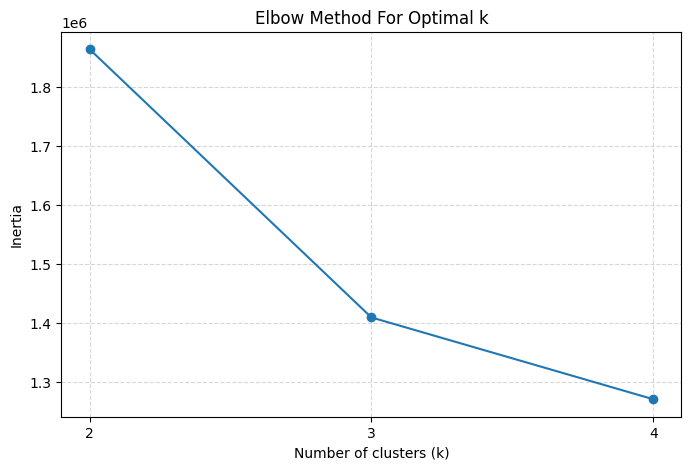

In [51]:
plt.figure(figsize=(8,5))
plt.plot(results_df["k"], results_df["inertia"], marker='o')
plt.xlabel("Number of clusters (k)")
plt.ylabel("Inertia")
plt.title("Elbow Method For Optimal k")
plt.xticks(results_df["k"])
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()



In [50]:
SEGSDGSDG


NameError: name 'SEGSDGSDG' is not defined

In [ ]:
players = daily.groupby('user_id').agg(
    avg_risk = ('risk', 'mean')
)


In [ ]:
def plot_user_risk(daily: pd.DataFrame, user_id: int):
  u = daily[daily.user_id==user_id].sort_values("date")
  plt.figure(figsize=(16,6))
  plt.plot(u["date"], u["risk"],label="Risk", color="#1f77b4", linewidth=1.8, marker='o')
  plt.title("risk")
  plt.grid(True, linestyle="--", alpha=0.3)
  plt.legend()
  plt.tight_layout()
  plt.show()


In [ ]:
g = df.groupby('user_id')
df['risk_next'] = g['risk'].shift(-1)
df = df.dropna(subset=['risk_next'])


C:\Users\mathe\AppData\Local\Temp\ipykernel_8932\730150144.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  g = df.groupby('user_id')


In [ ]:
del g
gc.collect()


0

In [ ]:
df.sort_values(by=['user_id'], ascending=True)


,game_id,user_id,bet_id,fiat_bet_amount,fiat_profit_amount,timestamp,saldo,n_aposta,risk,global_avg_game_bet_amount,...,risk_50_mean_games,risk_50_std_games,risk_50_median_games,risk_100_mean_games,risk_100_std_games,risk_100_median_games,risk_200_mean_games,risk_200_std_games,risk_200_median_games,risk_next
9937162,2860133,44,222184751,3.887975e-05,3.032620e-05,1600401615,0.003653,37,-0.384217,0.351370,...,0.287597,0.502659,0.046810,0.287597,0.502659,0.046810,0.287597,0.502659,0.046810,0.694334
16112554,2879418,44,229158128,3.210774e-05,-3.210774e-05,1600920009,0.560952,59,-1.499871,0.248493,...,0.026708,1.019575,0.019166,0.087721,0.962287,0.026665,0.087721,0.962287,0.026665,-2.017472
7256758,2851786,44,219113840,3.763946e-05,1.467939e-05,1600142423,0.000473,25,0.210798,0.122415,...,0.197758,0.322475,0.026665,0.197758,0.322475,0.026665,0.197758,0.322475,0.026665,0.072197
1308185,2832686,44,212397916,1.404929e-04,1.404929e-04,1599710467,0.000169,5,0.912631,0.129546,...,0.275704,0.385344,0.053873,0.275704,0.385344,0.053873,0.275704,0.385344,0.053873,0.484821
7256474,2851785,44,219113483,3.763946e-05,3.763946e-06,1600142423,0.000458,24,0.046810,0.490751,...,0.197214,0.329399,0.023678,0.197214,0.329399,0.023678,0.197214,0.329399,0.023678,0.210798
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23334113,2899994,1503513,237079156,2.605529e-02,-2.605529e-02,1601438402,-0.014844,4,1.364282,0.493351,...,0.928678,0.891669,0.813049,0.928678,0.891669,0.813049,0.928678,0.891669,0.813049,1.034682
23333744,2899993,1503513,237079093,2.605529e-02,1.146433e-02,1601438402,0.011212,3,1.972753,0.345826,...,0.783477,1.032526,0.261817,0.783477,1.032526,0.261817,0.783477,1.032526,0.261817,1.364282
23333002,2899991,1503513,237078064,8.418509e-05,-8.418509e-05,1601438402,-0.000084,1,0.115860,0.143022,...,0.115860,NaN,0.115860,0.115860,NaN,0.115860,0.115860,NaN,0.115860,0.261817
23330795,2899985,1503516,237076030,2.671013e-10,-2.671013e-10,1601438402,-0.080130,2,-5.370585,0.153889,...,-2.674947,3.812208,-2.674947,-2.674947,3.812208,-2.674947,-2.674947,3.812208,-2.674947,-1.122952
